In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import numpy.random as random
import scipy
from neuron import Neuron, Log
from simulation import Simulator
from util import get_combinations
from collections import namedtuple
from collections import OrderedDict
from plot import *
import pickle
from tqdm import tqdm
from matplotlib import cm


# pltaspect = (4,3)

In [9]:
a = 0.1
scipy.special.softmax(-a * np.arange(3))

array([0.3671654 , 0.33222499, 0.30060961])

# Ornstein-Uhlenbeck

Initialise complex model:

In [56]:
neuron_parameters = OrderedDict(
    N = [10],
    S = [5],
    tau_W=[1],
    beta = [1],
    n_C = [2],
    n_g = [2],
    gamma = [1],
    phi = [2]
)

complex_neuron_for_summary = []
for p in get_combinations(neuron_parameters):
    complex_neuron_for_summary.append(Neuron(p.N, p.S, p.tau_W, p.beta, gamma=p.gamma, phi=p.phi, n_C=p.n_C, n_g=p.n_g))

Initialise simple models:

In [20]:
simple_neuron_parameters = OrderedDict(
    N = [10],
    S = [1],
    # tau_W=[0.63, 3.27, 14.54, 61.17, 295.59],
    # tau_W= [  0.43580738,   1.97280049,   8.02023061,  32.1402713 ,
    #     152.62443861],
    # tau_W=[0.63],
    tau_W = [ 0.65486921,  2.31590864,  6.78519102, 19.00408772, 56.05794404],
    beta = [0],
    n_C = [2]
)

simple_neurons_for_summary = []
for p in get_combinations(simple_neuron_parameters):
    simple_neurons_for_summary.append(Neuron(p.N, p.S, p.tau_W, p.beta, p.n_C))

In [21]:
with open('../data/test.pkl', 'wb+') as f:
    pickle.dump(simple_neurons_for_summary, f)

### O-U for u, y and z:

In [77]:
env_parameters_ou = OrderedDict(
    # sigma_s = [0.1],
    sigma_s = [1],
    # epsilon = [0.02, 0.05, 0.1, 0.2, 0.5, 1, 2],
    epsilon = [0.1, 1],
    sigma_y = [1],
    # sigma_y = [0],
    # tau_y = [0.1, 0.2, 0.5, 1, 2, 5, 10, 20],
    tau_y = [0.1, 20],
    tau_u = [0.1],
    tau_z = [40],
    sigma_z = [1]
)

envs_for_summary_ou = []
for p in get_combinations(env_parameters_ou):
    envs_for_summary_ou.append(Simulator(p.sigma_s, p.epsilon, p.sigma_y, p.tau_y, tau_u=p.tau_u, tau_z=p.tau_z, sigma_z=p.sigma_z, u_mode='ou', y_mode='ou', z_mode='ou', dt=0.002))

In [20]:
trials_complex_summary_ou = OrderedDict(
    neuron = complex_neuron_for_summary,
    env = envs_for_summary_ou
)

T = 1000

# run all the combinations available
for trial in tqdm(get_combinations(trials_complex_summary_ou)):
    trial.env.run(trial.neuron, T=T, summary=False, cutoff=-0.6)

100%|██████████| 4/4 [03:12<00:00, 48.01s/it]


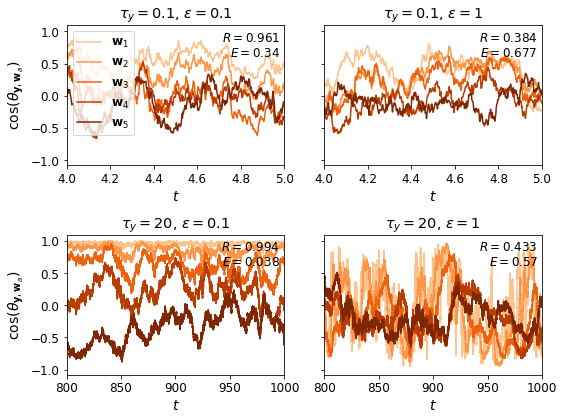

In [23]:
fig12 = plot_wy_align(complex_neuron_for_summary[0], blocks=(40,50))

### O-U for both u and y:

In [35]:
env_parameters_ou = OrderedDict(
    # sigma_s = [0.1],
    sigma_s = [1],
    # epsilon = [0.02, 0.05, 0.1, 0.2, 0.5, 1, 2],
    epsilon = [0.1, 2],
    sigma_y = [2],
    # sigma_y = [0],
    # tau_y = [0.1, 0.2, 0.5, 1, 2, 5, 10, 20],
    tau_y = [0.1, 20],
    tau_u = [0.1]
)

envs_for_summary_ou = []
for p in get_combinations(env_parameters_ou):
    envs_for_summary_ou.append(Simulator(p.sigma_s, p.epsilon, p.sigma_y, p.tau_y, tau_u=p.tau_u, u_mode='ou', y_mode='ou', dt=0.002))

Run simluation with complex model:

In [36]:
trials_complex_summary_ou = OrderedDict(
    neuron = complex_neuron_for_summary,
    env = envs_for_summary_ou
)

T = 1000

# run all the combinations available
for trial in tqdm(get_combinations(trials_complex_summary_ou)):
    trial.env.run(trial.neuron, T=T, summary=False, cutoff=-0.6)

100%|██████████| 4/4 [02:46<00:00, 41.74s/it]


Run simluation with simple models:

In [24]:
trials_simple_summary_ou = OrderedDict(
    neuron = simple_neurons_for_summary,
    env = envs_for_summary_ou
)

T = 1000

# run all the combinations available
for trial in tqdm(get_combinations(trials_simple_summary_ou)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.6)

100%|██████████| 280/280 [3:25:02<00:00, 43.94s/it]


### Results

In [15]:
with open('../data/complex_ou19.pkl', 'wb+') as f:
    pickle.dump(complex_neuron_for_summary, f)

In [25]:
# with open('../data/simple_ou5.pkl', 'wb+') as f:
#     pickle.dump(simple_neurons_for_summary, f)

In [21]:
with open('../data/complex_ou_example19.pkl', 'wb+') as f:
    pickle.dump(complex_neuron_for_summary, f)

1. $S=5$, $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1$. (THESE ARE DEFAULT VALUES).

2. $\sigma_s = \sigma_y = \beta = 1$, $ \tau_w = 0.2$, $\tau_u =0.1$, $n=2$.

3. $\sigma_s = \sigma_y = \tau_w = 1$, $\beta = 2$, $\tau_u =0.1$, $n=2$.

4. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n=2$, $\gamma=1.5$.

5. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n_C=2$, $n_g=1.5$.

6. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n_C=2$, $n_g=1.2$.

7. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1.1$.

8. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1.2$.

9. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n_C=2$, $n_g=1$.

19. $\sigma_s =  \tau_w = \beta = \sigma_y = 1$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1$ (default), range of $\phi$ values from $10$ to $-2$.


20. $\sigma_s =  \tau_w = \beta = 1$, $\sigma_y = 2$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1$, range of $\phi$ values from $10$ to $-2$.

21. $\sigma_s =  \tau_w = \beta = 1$, $\sigma_y = 0.5$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1$, range of $\phi$ values from $10$ to $-2$.

22. $S=3$, $\sigma_s =  \tau_w = \beta = 1$, $\sigma_y = 1$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1$, range of $\phi$ values from $10$ to $-2$.

23. $S=3$, $\sigma_s =  \tau_w = \beta = 1$, $\sigma_y = 2$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1$, range of $\phi$ values from $10$ to $-2$. 

24. $S=3$, $\sigma_s =  \tau_w = \beta = 1$, $\sigma_y = 0.5$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1$, range of $\phi$ values from $10$ to $-2$. 

25. $\tau_z = 20$ (block), $\sigma_s =  \tau_w = \beta = 1$, $\sigma_y = 1$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1$, range of $\phi$ values from $10$ to $-2$.

26.  $\tau_z = 20$ (block), $\sigma_s =  \tau_w = \beta = 1$, $\sigma_y = 2$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1$, range of $\phi$ values from $10$ to $-2$.

27. $\sigma_s =  \tau_w = \beta = \sigma_y = 1$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1$ (default), range of $\phi$ and $\psi$ values.


28. $\sigma_s =  \tau_w = \beta = 1$, $\sigma_y = 2$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1$, range of $\phi$ and $\psi$ values.

29. $\sigma_s =  \tau_w = \beta = 1$, $\sigma_y = 0.5$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1$, range of $\phi$ and $\psi$ values.

LOAD:

In [69]:
with open('../data/vari_phi_test_block_example1-5-0.pkl', 'rb') as f:
    complex_neuron_for_summary = pickle.load(f)

In [2]:
with open('../final_data/complex_block1.pkl', 'rb') as f:
    complex_neuron_for_summary = pickle.load(f)
with open('../final_data/simple_new_block1.pkl', 'rb') as f:
    simple_neurons_for_summary = pickle.load(f)

In [48]:
with open('../data/complex_ou27.pkl', 'rb') as f:
    complex_neuron_for_summary1 = pickle.load(f)

In [25]:
neuron = complex_neuron_for_summary[0]
log = complex_neuron_for_summary[0].logs[0]
cos = (neuron.po.T[None, :, :] @ log.W @ log.y / np.sqrt(neuron.po.T[None, :, :] @ log.W @ np.transpose(neuron.po.T[None, :, :] @ log.W, (0,2,1)))).squeeze()
cos

array([-0.07074965, -0.06564504, -0.12055614, ..., -0.82806989,
       -0.82916607, -0.81742055])

Theoretical fixed point solution and stability.

From Yashar's work:
`W_ast` is the theoretical fixed point solution.
Stability conditions are 
$$-\chi < \dfrac{2}{3} \lambda_1,$$
$$-\chi < \lambda_1 - \lambda_i \ \ \ \ \ (i>1).$$

In [23]:
log = complex_neuron_for_summary[0].logs[3]
# log = simple_neurons_for_summary[0].logs[0]
# print(log.W[:, [0], :].shape)
# print(log.z.shape)
# print((np.transpose(log.z, (0,2,1)) @ log.z / np.sqrt(np.transpose(log.y, (0,2,1)) @ log.y)).squeeze().shape)
# print(np.mean(np.abs((np.transpose(log.y, (0,2,1)) @ log.z / np.sqrt(np.transpose(log.y, (0,2,1)) @ log.y))).squeeze()))
# print(np.mean(np.abs((np.transpose(log.u, (0,2,1)) @ log.z / np.sqrt(np.transpose(log.u, (0,2,1)) @ log.u))).squeeze()))
# print(np.mean(log.y, axis=0).squeeze())
# print(np.mean(np.sqrt(np.transpose(log.u, (0,2,1)) @ log.u), axis=0).squeeze())
# print(log.W[:, [0], :])
y = log.y[-1]
z = log.z[-1]
P = complex_neuron_for_summary[0].P
p = complex_neuron_for_summary[0].p
e1 = complex_neuron_for_summary[0].e1
C = log.env_parameters['sigma_s'] ** 2 * (y @ y.T) + log.env_parameters['epsilon'] ** 2 * np.eye(complex_neuron_for_summary[0].N)
C
print(np.linalg.eigvals(C))
lambda1 = np.max(np.linalg.eigvals(C))
lambda1
L = complex_neuron_for_summary[0].L
L_inv = np.linalg.inv(L)
print(L_inv)
chi = 1/(p.T @ L_inv @ e1).item()
chi
k1 = np.sqrt((1/complex_neuron_for_summary[0].alpha) * (1 + chi/lambda1))
k1
W_ast = k1 * chi * (L_inv @ complex_neuron_for_summary[0].e1 @ y.T)
W_ast
print('chi = {}'.format(chi))
W = log.W[-1]

for i in range(5):
    print(W[i, :] @ y / (np.sqrt(W[i, :].T @ W[i, :]) * np.sqrt(y.T @ y)))
for i in range(5):
    print(W[i, :] @ z / np.sqrt(W[i, :].T @ W[i, :]))

# print(L @ W + P @ W @ C - complex_neuron_for_summary[0].alpha * np.trace(P @ W @ C @ W.T) * (P @ W))
# print(L @ W_ast + P @ W_ast @ C - complex_neuron_for_summary[0].alpha * np.trace(P @ W_ast @ C @ W_ast.T) * (P @ W_ast))

[5. 4. 4. 4. 4. 4. 4. 4. 4. 4.]
[[ -62. -120. -224. -384. -512.]
 [ -60. -120. -224. -384. -512.]
 [ -56. -112. -224. -384. -512.]
 [ -48.  -96. -192. -384. -512.]
 [ -32.  -64. -128. -256. -512.]]
chi = -0.01622528094942886
[[-0.076747]]
[[-0.01117949]]
[[-0.7120363]]
[[-0.43778528]]
[[-0.30361128]]
[0.19490925]
[-0.09590881]
[-0.44370439]
[-0.13144556]
[-0.20601789]


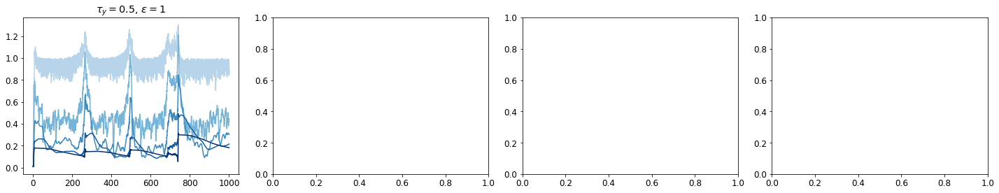

In [70]:
# for j in range(7):

# with open('../data/complex_ou_example22-3.pkl', 'rb') as f:
#     complex_neuron_for_summary = pickle.load(f)

# log = complex_neuron_for_summary[0].logs[1]

fig8, axs8 = plt.subplots(1, 4, figsize=(20,4))

cm_section = np.linspace(0.3, 1, 5)
oranges = [ cm.Oranges(x) for x in cm_section ]
blues = [ cm.Blues(x) for x in cm_section ]

for i, log in enumerate(complex_neuron_for_summary[0].logs):

    for k in range(complex_neuron_for_summary[0].S):
        # axs8.plot(
        #     log.timeline, 
        #     (log.W[:, [k], :] @ log.y).squeeze(),
        #     color = oranges[k],
        #     # label = '$\mathbf{{w}}_{{{k}}}$'.format(k=k+1)
        # )

        axs8[i].plot(
            log.timeline, 
            (np.sqrt(log.W[:, [k], :] @ np.transpose(log.W[:, [k], :], (0,2,1)))).squeeze(), 
            color = blues[k],
            # label = '$\mathbf{{w}}_{{{k}}}$'.format(k=k+1)
        )

    # log.W[-10:,[2],:]

    axs8[i].set_title('$\\tau_y={}$, $\epsilon={}$'.format(log.env_parameters['tau_y'], log.env_parameters['epsilon']))

fig8.tight_layout()

# fig8.savefig('figures/log/norms_default.pdf', bbox_inches='tight')

In [15]:
np.mean((np.sqrt(log.W[-10000:, [4], :] @ np.transpose(log.W[-10000:, [k], :], (0,2,1)))).squeeze())

0.2672186105903407

In [114]:
fig8.savefig('figures/log/norm_n_g=1.pdf', bbox_inches='tight')

Characteristic timescales:

In [8]:
complex_neuron_for_summary[0].timescales_whole(log=complex_neuron_for_summary[0].logs[3])

array([[9.52966423e-02, 2.56951391e+00, 1.31722157e+01, 5.84278016e+01,
        2.87254934e+02],
       [6.26369371e-01, 3.26066795e+00, 1.45242699e+01, 6.11384809e+01,
        2.95495406e+02],
       [6.26369371e-01, 3.26066795e+00, 1.45242699e+01, 6.11384809e+01,
        2.95495406e+02],
       [6.26369371e-01, 3.26066795e+00, 1.45242699e+01, 6.11384809e+01,
        2.95495406e+02],
       [6.26369371e-01, 3.26066795e+00, 1.45242699e+01, 6.11384809e+01,
        2.95495406e+02],
       [6.26369371e-01, 3.26066795e+00, 1.45242699e+01, 6.11384809e+01,
        2.95495406e+02],
       [6.26369371e-01, 3.26066795e+00, 1.45242699e+01, 6.11384809e+01,
        2.95495406e+02],
       [6.26369371e-01, 3.26066795e+00, 1.45242699e+01, 6.11384809e+01,
        2.95495406e+02],
       [6.26369371e-01, 3.26066795e+00, 1.45242699e+01, 6.11384809e+01,
        2.95495406e+02],
       [6.26369371e-01, 3.26066795e+00, 1.45242699e+01, 6.11384809e+01,
        2.95495406e+02]])

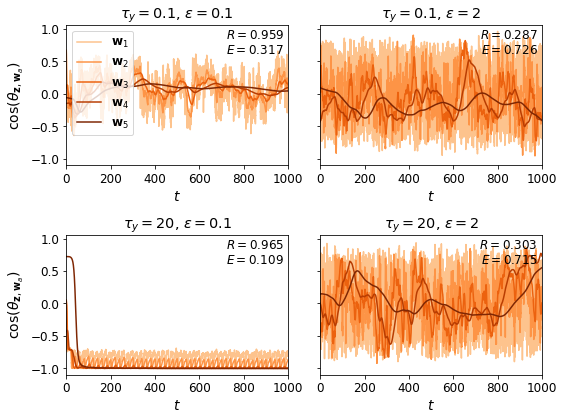

In [27]:
fig11 = plot_wz_align(complex_neuron_for_summary[0])

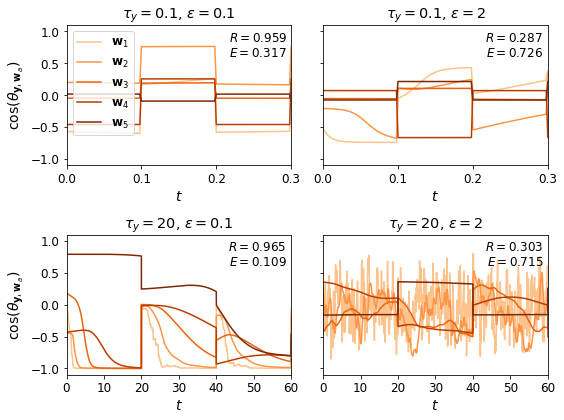

In [28]:
fig12 = plot_wy_align(complex_neuron_for_summary[0])

<ipython-input-19-7426b33d7a0d>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig7, axs7 = plt.subplots(1, 5, figsize=(14,3))


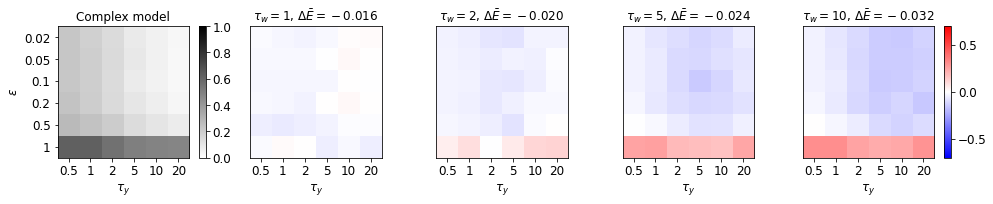

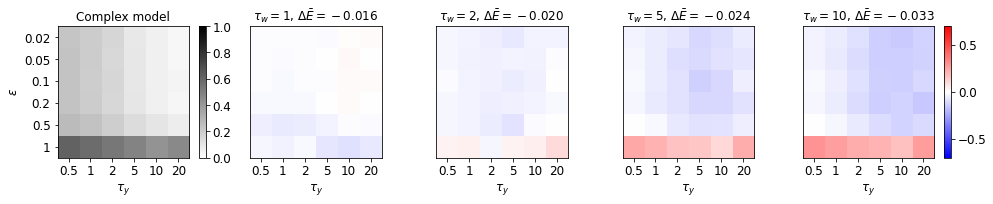

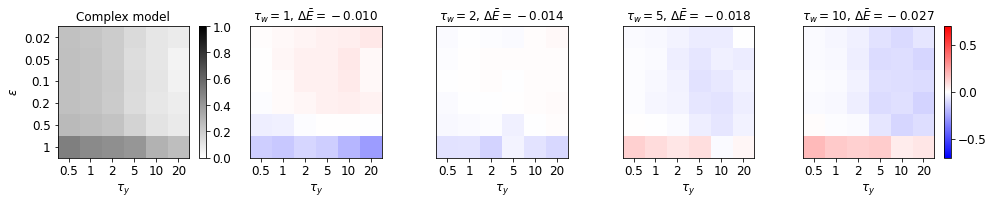

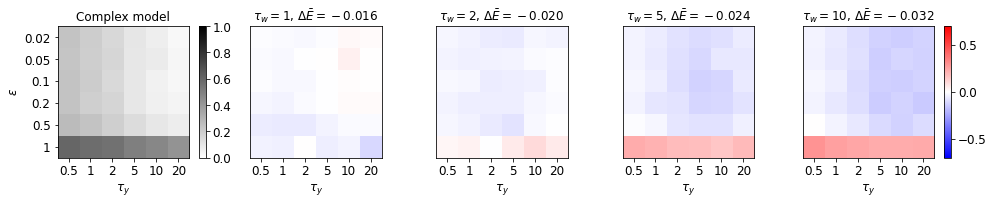

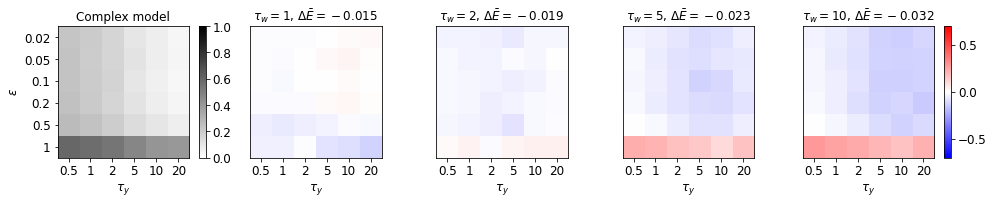

...

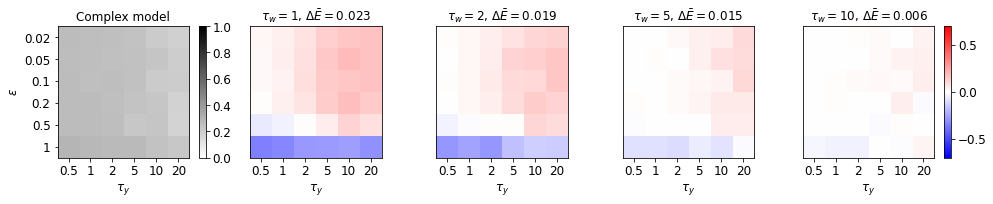

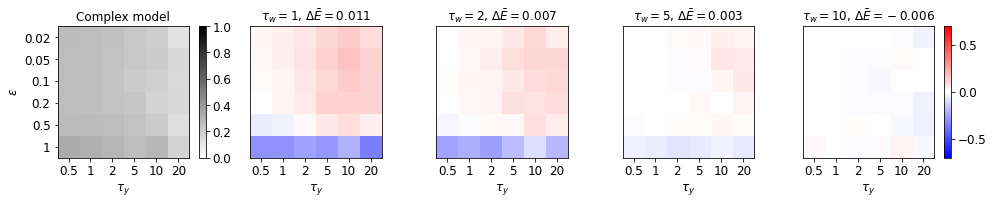

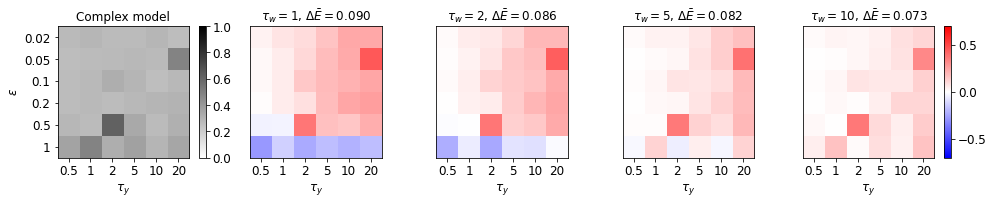

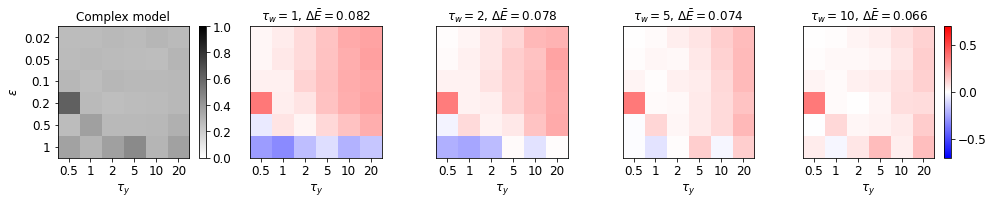

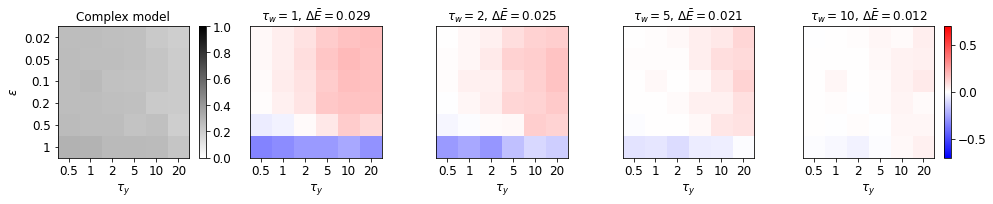

In [19]:
# with open('../data/complex_ou1.pkl', 'rb') as f:
#     complex_neuron_for_summary = pickle.load(f)

for n in complex_neuron_for_summary:

    fig7, axs7 = plt.subplots(1, 5, figsize=(14,3))
    # fig7, axs7 = plt.subplots(1, 4, figsize=(20,4))

    ims = []

    ims.append(plot_cm_E_abs(fig7, axs7[0], n))

    for j, neuron in enumerate(simple_neurons_for_summary[:4]):

        ims.append(plot_cm_E_diff(fig7, axs7[j+1],  simple_neurons_for_summary[j], n))

    # cbaxes1 = fig7.add_axes([0, 0.3, 0.01, 0.6])
    # cbaxes2 = fig7.add_axes([0.99, 0.3, 0.01, 0.6])

    fig7.colorbar(ims[0], ax=axs7[0], )
    fig7.colorbar(ims[-1], ax=axs7[-1], )
    fig7.tight_layout()
    # fig7.savefig('figures/log/colormap_relative_phi={}.pdf'.format(n.hyper['phi']), bbox_inches='tight')

In [18]:
fig7.savefig('../final_figure/colormap_test.pdf', bbox_inches='tight')

<ipython-input-49-e2a4d4c610eb>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig7, axs7 = plt.subplots(1, 5, figsize=(23,4))


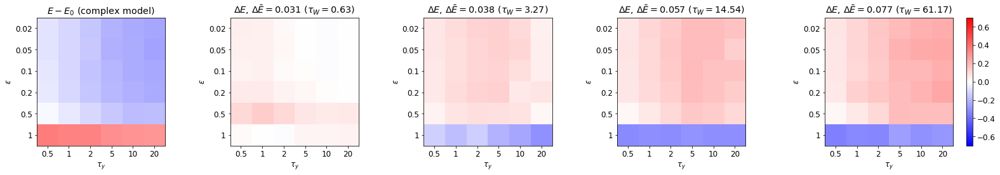

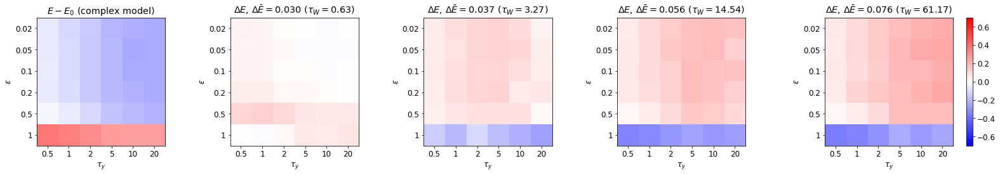

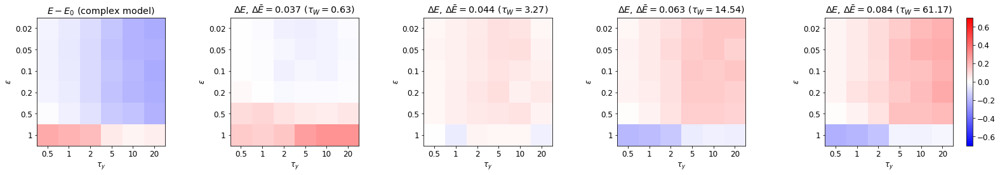

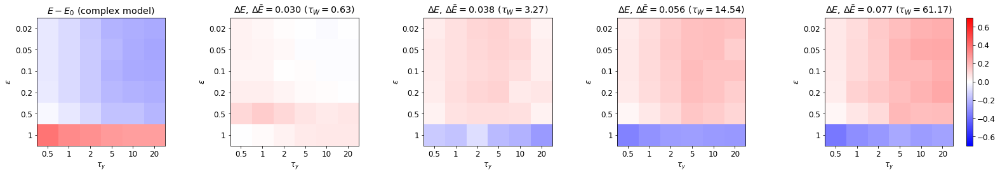

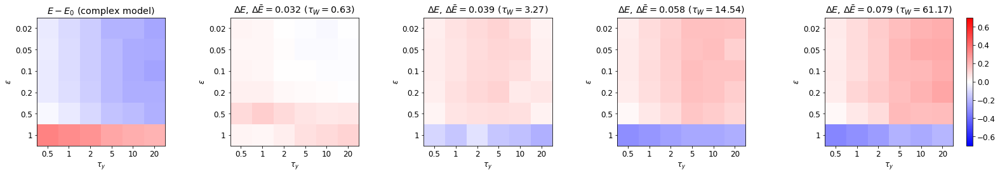

...

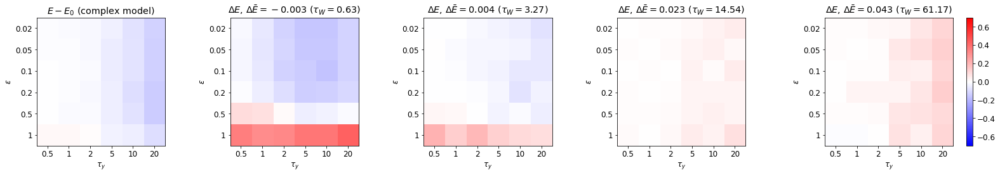

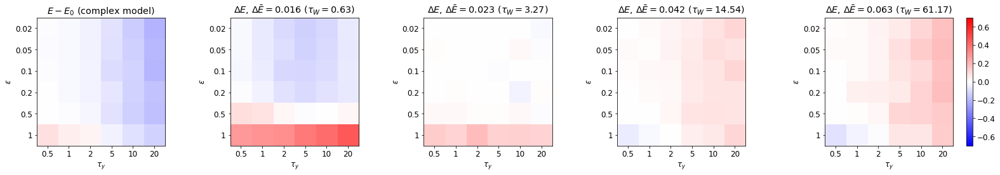

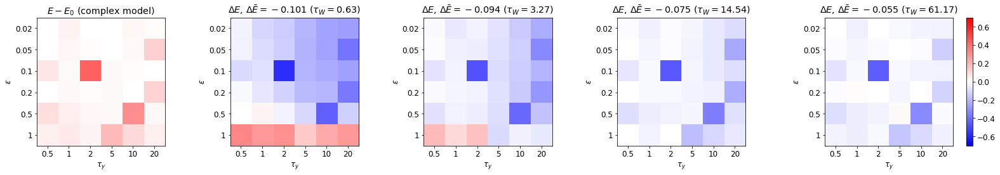

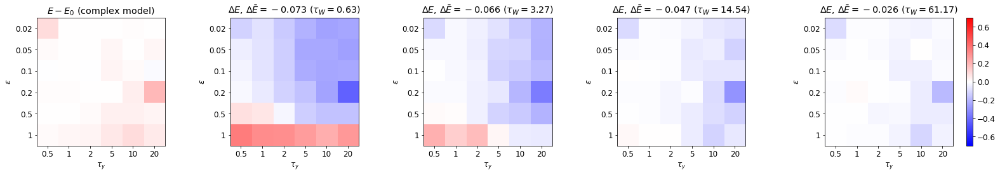

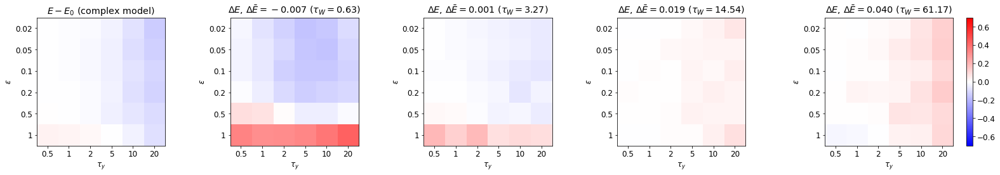

In [49]:
# with open('../data/complex_ou1.pkl', 'rb') as f:
#     complex_neuron_for_summary1 = pickle.load(f)

for n in complex_neuron_for_summary1:

    fig7, axs7 = plt.subplots(1, 5, figsize=(23,4))
    # fig7, axs7 = plt.subplots(1, 4, figsize=(20,4))

    ims = []

    ims.append(plot_cm_E_minus_reference(fig7, axs7[0], n))

    for j, neuron in enumerate(simple_neurons_for_summary[:4]):

        ims.append(plot_cm_E_diff(fig7, axs7[j+1], n, simple_neurons_for_summary[j]))

    # fig7.colorbar(ims[0], ax=axs7[0])
    fig7.colorbar(ims[-1], ax=axs7[-1])
    fig7.tight_layout()
    # fig7.savefig('figures/log/colormap_relative_phi={}.pdf'.format(n.hyper['phi']), bbox_inches='tight')

In [47]:
log = complex_neuron_for_summary[0].logs[-1]
log.po[]

In [47]:
fig7.savefig('figures/log/colormap_relative_default.pdf', bbox_inches='tight')

Naive estimator performance (needs to be computed from an "example" save, should only depend on $\sigma_y$):

In [12]:
log = complex_neuron_for_summary[0].logs[1]
cos = (np.transpose(log.z, (0,2,1)) @ log.y).squeeze()
d = 1-cos
print(np.mean(d))

0.2928932188134524


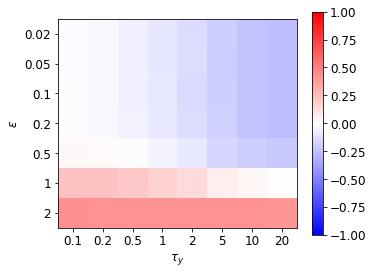

In [31]:
fig77, axs77 = plt.subplots(figsize=(5,4))
im = plot_cm_E_minus_reference(fig77, axs77, complex_neuron_for_summary[0], np.mean(d))
fig77.colorbar(im)

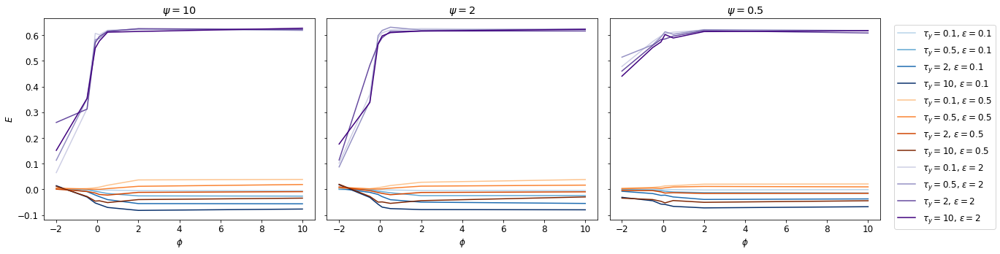

In [28]:
epsilon_list = [0.1, 0.5, 2]
tau_y_list = [0.1, 0.5, 2, 10]
psi_list = [10, 2, 0.5]
fig_phi = plot_compare_phi_psi(complex_neuron_for_summary, epsilon_list, tau_y_list, psi_list)
fig_phi.savefig('figures/log/compare_phi_psi_sigma_y=0.5.pdf', bbox_inches='tight')

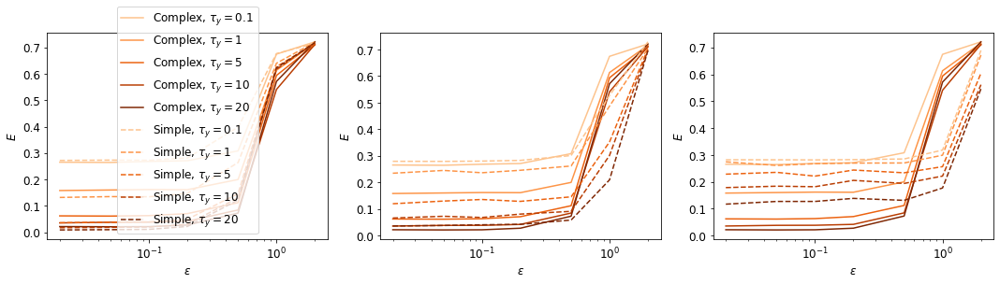

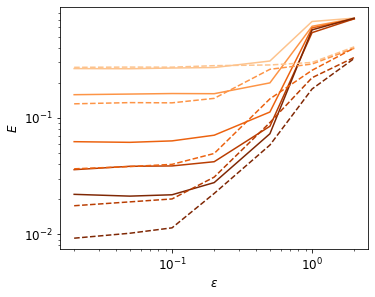

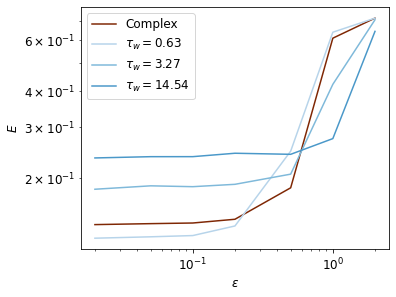

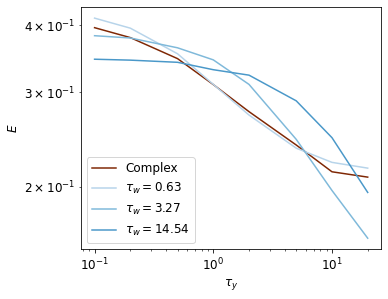

In [5]:
cm_section = np.linspace(0.3, 1, 5)
blues1 = [ cm.Blues(x) for x in cm_section ]
oranges1 = [ cm.Oranges(x) for x in cm_section ]

fig6, axs6 = plt.subplots(1, 3, figsize=(15,4))

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
        plot_E(fig6, axs6[j], complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

    for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
        plot_E(fig6, axs6[j], neuron, 'epsilon', color=oranges1[i], label='Simple, $\\tau_y={}$'.format(tau_y), style='--', tau_y=tau_y)

    axs6[j].set_xscale('log')
    axs6[j].set_yscale('linear')

    axs6[j].set_xlabel('$\epsilon$')
    axs6[j].set_ylabel('$E$')

axs6[0].legend()

''''''''''''

fig66, axs66 = plt.subplots(figsize=(5,4))

for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
    plot_E(fig66, axs66, complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
    plot_E_best(fig66, axs66, simple_neurons_for_summary, 'epsilon', color=oranges1[i], label='Simple, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

axs66.set_xscale('log')
axs66.set_yscale('log')

axs66.set_xlabel('$\epsilon$')
axs66.set_ylabel('$E$')

# axs66.legend()

''''''''''''
cm_section = np.linspace(0.3, 0.9, len(simple_neurons_for_summary))
blues3 = [ cm.Blues(x) for x in cm_section ]
oranges3 = [ cm.Oranges(x) for x in cm_section ]

fig666, axs666 = plt.subplots(figsize=(5,4))
plot_E_average(fig666, axs666, complex_neuron_for_summary[0], 'epsilon', color=oranges1[-1], label='Complex')

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    plot_E_average(fig666, axs666, neuron, 'epsilon', color=blues3[j])

axs666.set_xscale('log')
axs666.set_yscale('log')

axs666.set_xlabel('$\epsilon$')
axs666.set_ylabel('$E$')

axs666.legend()

''''''''''''

cm_section = np.linspace(0.3, 0.9, len(simple_neurons_for_summary))
blues3 = [ cm.Blues(x) for x in cm_section ]
oranges3 = [ cm.Oranges(x) for x in cm_section ]

fig6666, axs6666 = plt.subplots(figsize=(5,4))
plot_E_average(fig6666, axs6666, complex_neuron_for_summary[0], 'tau_y', color=oranges1[-1], label='Complex')

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    plot_E_average(fig6666, axs6666, neuron, 'tau_y', color=blues3[j])

axs6666.set_xscale('log')
axs6666.set_yscale('log')

axs6666.set_xlabel('$\\tau_y$')
axs6666.set_ylabel('$E$')

axs6666.legend()

In [68]:
fig6.tight_layout()
fig66.tight_layout()
fig666.tight_layout()
fig6666.tight_layout()
fig6.savefig('figures/full_ou_1_individual.pdf', bbox_inches='tight')
fig66.savefig('figures/full_ou_1_best.pdf', bbox_inches='tight')
fig666.savefig('figures/full_ou_1_epsilon_averaged.pdf', bbox_inches='tight')
fig6666.savefig('figures/full_ou_1_tau_y_averaged.pdf', bbox_inches='tight')

### O-U for $\boldsymbol{u}$, block update for $\boldsymbol{y}$:

In [38]:
env_parameters_ou = OrderedDict(
    # sigma_s = [0.1],
    sigma_s = [1],
    epsilon = [0.02, 0.05, 0.1, 0.2, 0.5, 1, 2],
    # epsilon = [0.1, 1],
    sigma_y = [1],
    # sigma_y = [0],
    tau_y = [0.1, 0.2, 0.5, 1, 2, 5, 10, 20],
    # tau_y = [0.1, 20],
    tau_u = [0.1]
)

envs_for_summary_ou = []
for p in get_combinations(env_parameters_ou):
    envs_for_summary_ou.append(Simulator(p.sigma_s, p.epsilon, p.sigma_y, p.tau_y, tau_u=p.tau_u, u_mode='ou', y_mode='ou', z_mode='ou', dt=0.002))

Run simluation with complex model:

In [39]:
trials_complex_summary_ou = OrderedDict(
    neuron = complex_neuron_for_summary,
    env = envs_for_summary_ou
)

T = 1000

# run all the combinations available
for trial in tqdm(get_combinations(trials_complex_summary_ou)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.6)

100%|██████████| 56/56 [29:22<00:00, 31.48s/it]


Run simluation with simple models:

In [40]:
trials_simple_summary_ou = OrderedDict(
    neuron = simple_neurons_for_summary,
    env = envs_for_summary_ou
)

T = 1000

# run all the combinations available
for trial in tqdm(get_combinations(trials_simple_summary_ou)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.6)

100%|██████████| 280/280 [2:15:00<00:00, 28.93s/it]


### Results

1. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n=2$.

In [41]:
# with open('../data/complex_ou_u1.pkl', 'wb+') as f:
#     pickle.dump(complex_neuron_for_summary, f)

In [42]:
# with open('../data/simple_ou_u1.pkl', 'wb+') as f:
#     pickle.dump(simple_neurons_for_summary, f)

In [27]:
# with open('../data/complex_ou_u_example1.pkl', 'wb+') as f:
#     pickle.dump(complex_neuron_for_summary, f)

In [69]:
with open('../data/complex_ou_u1.pkl', 'rb') as f:
    complex_neuron_for_summary = pickle.load(f)
with open('../data/simple_ou_u1.pkl', 'rb') as f:
    simple_neurons_for_summary = pickle.load(f)

1.:

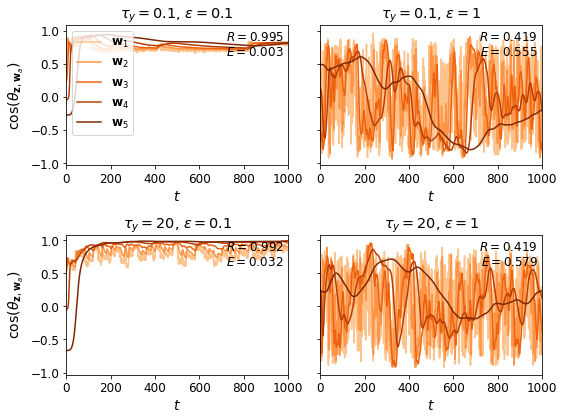

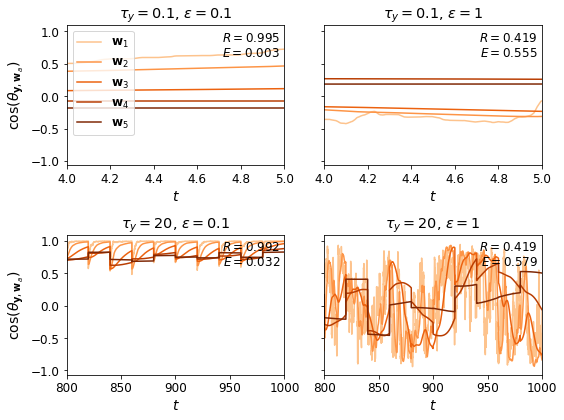

In [26]:
fig11 = plot_wz_align(complex_neuron_for_summary[0])
fig12 = plot_wy_align(complex_neuron_for_summary[0], blocks=(40,50))

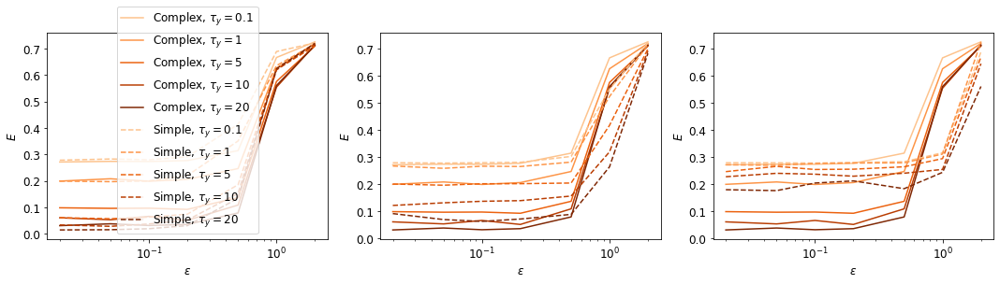

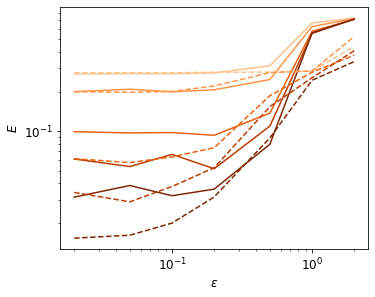

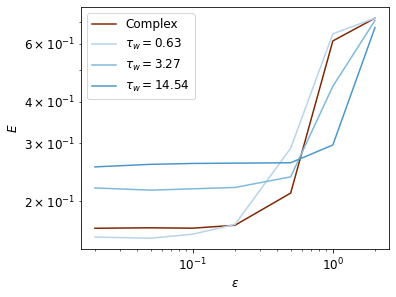

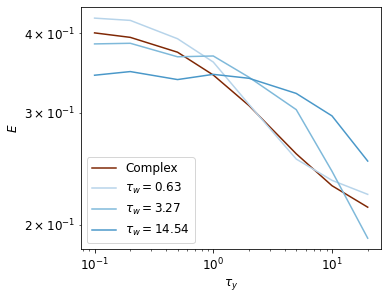

In [43]:
cm_section = np.linspace(0.3, 1, 5)
blues1 = [ cm.Blues(x) for x in cm_section ]
oranges1 = [ cm.Oranges(x) for x in cm_section ]

fig6, axs6 = plt.subplots(1, 3, figsize=(15,4))

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
        plot_E(fig6, axs6[j], complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

    for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
        plot_E(fig6, axs6[j], neuron, 'epsilon', color=oranges1[i], label='Simple, $\\tau_y={}$'.format(tau_y), style='--', tau_y=tau_y)

    axs6[j].set_xscale('log')
    axs6[j].set_yscale('linear')

    axs6[j].set_xlabel('$\epsilon$')
    axs6[j].set_ylabel('$E$')

axs6[0].legend()

''''''''''''

fig66, axs66 = plt.subplots(figsize=(5,4))

for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
    plot_E(fig66, axs66, complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
    plot_E_best(fig66, axs66, simple_neurons_for_summary, 'epsilon', color=oranges1[i], label='Simple, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

axs66.set_xscale('log')
axs66.set_yscale('log')

axs66.set_xlabel('$\epsilon$')
axs66.set_ylabel('$E$')

# axs66.legend()

''''''''''''
cm_section = np.linspace(0.3, 0.9, len(simple_neurons_for_summary))
blues3 = [ cm.Blues(x) for x in cm_section ]
oranges3 = [ cm.Oranges(x) for x in cm_section ]

fig666, axs666 = plt.subplots(figsize=(5,4))
plot_E_average(fig666, axs666, complex_neuron_for_summary[0], 'epsilon', color=oranges1[-1], label='Complex')

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    plot_E_average(fig666, axs666, neuron, 'epsilon', color=blues3[j])

axs666.set_xscale('log')
axs666.set_yscale('log')

axs666.set_xlabel('$\epsilon$')
axs666.set_ylabel('$E$')

axs666.legend()

''''''''''''

cm_section = np.linspace(0.3, 0.9, len(simple_neurons_for_summary))
blues3 = [ cm.Blues(x) for x in cm_section ]
oranges3 = [ cm.Oranges(x) for x in cm_section ]

fig6666, axs6666 = plt.subplots(figsize=(5,4))
plot_E_average(fig6666, axs6666, complex_neuron_for_summary[0], 'tau_y', color=oranges1[-1], label='Complex')

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    plot_E_average(fig6666, axs6666, neuron, 'tau_y', color=blues3[j])

axs6666.set_xscale('log')
axs6666.set_yscale('log')

axs6666.set_xlabel('$\\tau_y$')
axs6666.set_ylabel('$E$')

axs6666.legend()

In [44]:
fig6.tight_layout()
fig66.tight_layout()
fig666.tight_layout()
fig6666.tight_layout()
fig6.savefig('figures/semi_ou_1_individual.pdf', bbox_inches='tight')
fig66.savefig('figures/semi_ou_1_best.pdf', bbox_inches='tight')
fig666.savefig('figures/semi_ou_1_epsilon_averaged.pdf', bbox_inches='tight')
fig6666.savefig('figures/semi_ou_1_tau_y_averaged.pdf', bbox_inches='tight')

### Smoothed block change:
(discontinued)

In [38]:
env_parameters_ou = OrderedDict(
    sigma_s = [1],
    epsilon = [0.02, 0.1, 0.4, 1.6],
    # epsilon = [0.1, 0.4],
    sigma_y = [1],
    tau_y = [10, 50, 100, 200],
    # tau_y = [50, 100],
    tau_u = [2]
)

envs_for_summary_ou = []
for p in get_combinations(env_parameters_ou):
    envs_for_summary_ou.append(Simulator(p.sigma_s, p.epsilon, p.sigma_y, p.tau_y, tau_u=p.tau_u, mode='ou', dt=0.01))

In [39]:
neuron_parameters = OrderedDict(
    N = [10],
    S = [5],
    tau_W=[1],
    beta = [1],
    n = [2]
)

complex_neuron_for_summary = []
for p in get_combinations(neuron_parameters):
    complex_neuron_for_summary.append(Neuron(p.N, p.S, p.tau_W, p.beta, p.n))

In [40]:
simple_neuron_parameters = OrderedDict(
    N = [10],
    S = [1],
    tau_W=[0.63, 3.27, 14.54, 61.17, 295.59],
    beta = [0],
    n = [2]
)

simple_neurons_for_summary = []
for p in get_combinations(simple_neuron_parameters):
    simple_neurons_for_summary.append(Neuron(p.N, p.S, p.tau_W, p.beta, p.n))

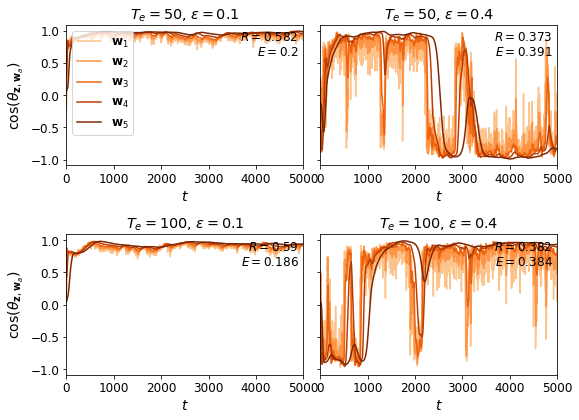

In [36]:
fig21 = plot_wz_align(complex_neuron_for_summary[0])

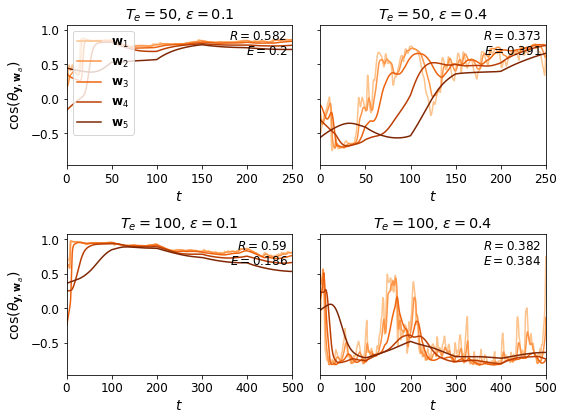

In [37]:
fig22 = plot_wy_align(complex_neuron_for_summary[0], blocks=(0, 5))

In [41]:
trials_complex_summary_ou = OrderedDict(
    neuron = complex_neuron_for_summary,
    env = envs_for_summary_ou
)

T = 5000

# run all the combinations available
for trial in tqdm(get_combinations(trials_complex_summary_ou)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.7)

100%|██████████| 16/16 [09:10<00:00, 34.43s/it]


In [42]:
trials_simple_summary_ou = OrderedDict(
    neuron = simple_neurons_for_summary,
    env = envs_for_summary_ou
)

T = 5000

# run all the combinations available
for trial in tqdm(get_combinations(trials_simple_summary_ou)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.7)

100%|██████████| 80/80 [41:30<00:00, 31.14s/it]


These are the "smoothed block change" results:

In [44]:
# with open('../data/complex_ou2.pkl', 'wb+') as f:
#     pickle.dump(complex_neuron_for_summary, f)

In [45]:
# with open('../data/simple_ou2.pkl', 'wb+') as f:
#     pickle.dump(simple_neurons_for_summary, f)

In [38]:
# with open('../data/complex_ou2.pkl', 'rb') as f:
#     complex_neuron_for_summary = pickle.load(f)

In [39]:
# with open('../data/simple_ou2.pkl', 'rb') as f:
#     simple_neurons_for_summary = pickle.load(f)

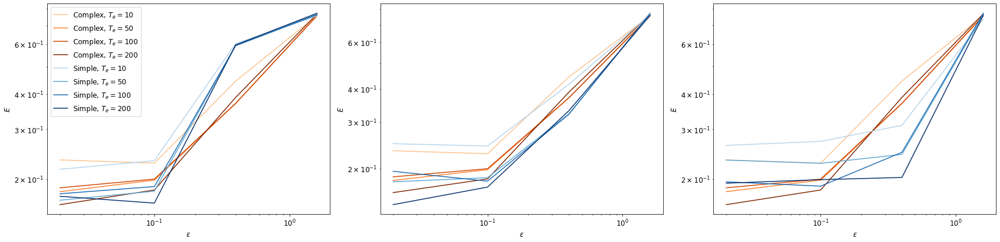

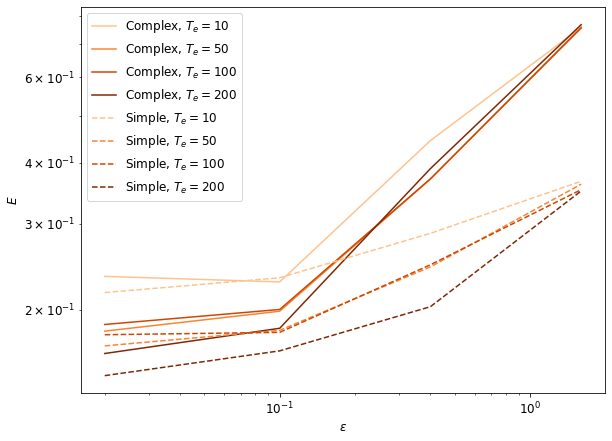

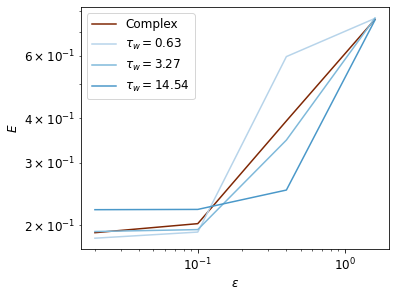

In [43]:
cm_section = np.linspace(0.3, 1, 4)
blues1 = [ cm.Blues(x) for x in cm_section ]
oranges1 = [ cm.Oranges(x) for x in cm_section ]

fig6, axs6 = plt.subplots(1, 3, figsize=(24,6))

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    for i, tau_y in enumerate([10, 50, 100, 200]):
        plot_E(fig6, axs6[j], complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

    for i, tau_y in enumerate([10, 50, 100, 200]):
        plot_E(fig6, axs6[j], neuron, 'epsilon', color=blues1[i], label='Simple, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

    axs6[j].set_xscale('log')
    axs6[j].set_yscale('log')

    axs6[j].set_xlabel('$\epsilon$')
    axs6[j].set_ylabel('$E$')

axs6[0].legend()

''''''''''''

fig66, axs66 = plt.subplots(figsize=(8,6))

for i, tau_y in enumerate([10, 50, 100, 200]):
    plot_E(fig66, axs66, complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

for i, tau_y in enumerate([10, 50, 100, 200]):
    plot_E_best(fig66, axs66, simple_neurons_for_summary, 'epsilon', color=oranges1[i], label='Simple, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

axs66.set_xscale('log')
axs66.set_yscale('log')

axs66.set_xlabel('$\epsilon$')
axs66.set_ylabel('$E$')

axs66.legend()

''''''''''''
cm_section = np.linspace(0.3, 0.9, len(simple_neurons_for_summary))
blues3 = [ cm.Blues(x) for x in cm_section ]
oranges3 = [ cm.Oranges(x) for x in cm_section ]

fig666, axs666 = plt.subplots(figsize=(5,4))
plot_E_average(fig666, axs666, complex_neuron_for_summary[0], 'epsilon', color=oranges1[-1], label='Complex')

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    plot_E_average(fig666, axs666, neuron, 'epsilon', color=blues3[j])

axs666.set_xscale('log')
axs666.set_yscale('log')

axs666.set_xlabel('$\epsilon$')
axs666.set_ylabel('$E$')

axs666.legend()

# Blocks, with $\tau_u$ added
(discontinued for now)

In [54]:
env_parameters_block = OrderedDict(
    # sigma_s = [0.1],
    sigma_s = [1],
    # epsilon = [0.02, 0.05, 0.1, 0.2, 0.5, 1, 2],
    epsilon = [0.1, 1],
    sigma_y = [1],
    # sigma_y = [0],
    # tau_y = [0.1, 0.2, 0.5, 1, 2, 5, 10, 20],
    tau_y = [0.1, 20],
    tau_u = [0.1]
)

envs_for_summary_block = []
for p in get_combinations(env_parameters_block):
    envs_for_summary_block.append(Simulator(p.sigma_s, p.epsilon, p.sigma_y, p.tau_y, tau_u=p.tau_u, mode='block', dt=0.002))

In [56]:
trials_complex_summary_block = OrderedDict(
    neuron = complex_neuron_for_summary,
    env = envs_for_summary_block
)

T = 1000

# run all the combinations available
for trial in tqdm(get_combinations(trials_complex_summary_block)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.6)

100%|██████████| 4/4 [01:38<00:00, 24.56s/it]


In [49]:
trials_simple_summary_block = OrderedDict(
    neuron = simple_neurons_for_summary,
    env = envs_for_summary_block
)

T = 1000

# run all the combinations available
for trial in tqdm(get_combinations(trials_simple_summary_block)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.6)

100%|██████████| 280/280 [1:30:25<00:00, 19.38s/it]


1. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n=2$.

In [50]:
# with open('../data/complex_block1.pkl', 'wb+') as f:
#     pickle.dump(complex_neuron_for_summary, f)

In [51]:
# with open('../data/simple_block1.pkl', 'wb+') as f:
#     pickle.dump(simple_neurons_for_summary, f)

In [58]:
# with open('../data/complex_block_example1.pkl', 'wb+') as f:
#     pickle.dump(complex_neuron_for_summary, f)

In [2]:
with open('../data/complex_block1.pkl', 'rb') as f:
    complex_neuron_for_summary = pickle.load(f)
with open('../data/simple_block1.pkl', 'rb') as f:
    simple_neurons_for_summary = pickle.load(f)

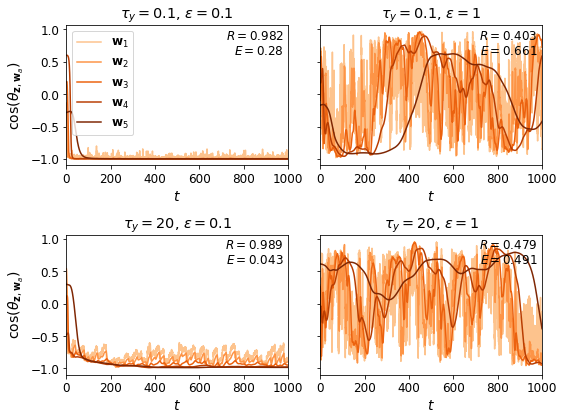

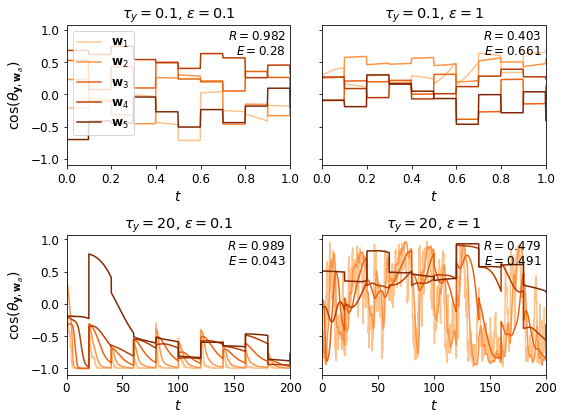

In [57]:
fig21 = plot_wz_align(complex_neuron_for_summary[0])
fig22 = plot_wy_align(complex_neuron_for_summary[0], blocks=(0, 10))

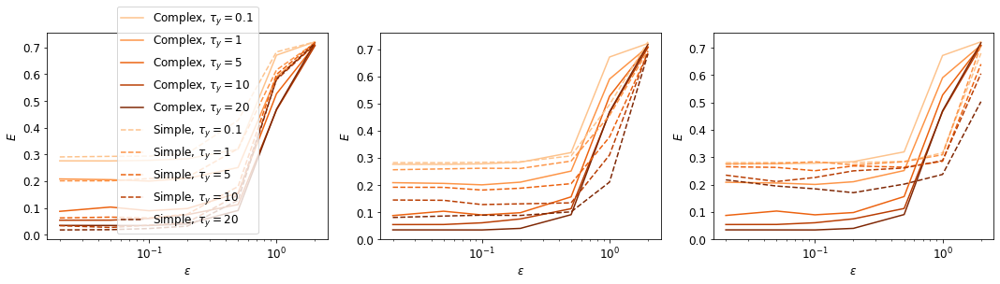

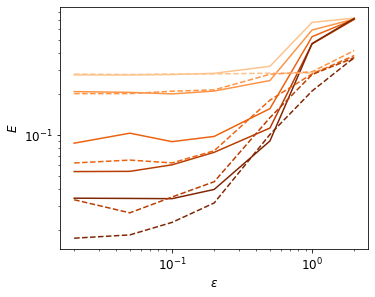

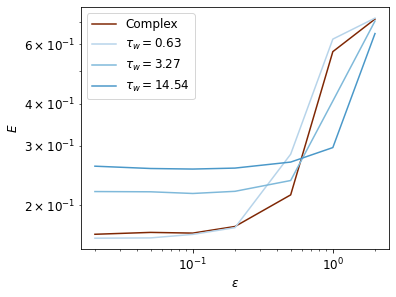

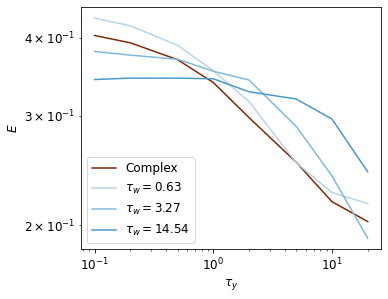

In [3]:
cm_section = np.linspace(0.3, 1, 5)
blues1 = [ cm.Blues(x) for x in cm_section ]
oranges1 = [ cm.Oranges(x) for x in cm_section ]

fig6, axs6 = plt.subplots(1, 3, figsize=(15,4))

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
        plot_E(fig6, axs6[j], complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

    for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
        plot_E(fig6, axs6[j], neuron, 'epsilon', color=oranges1[i], label='Simple, $\\tau_y={}$'.format(tau_y), style='--', tau_y=tau_y)

    axs6[j].set_xscale('log')
    axs6[j].set_yscale('linear')

    axs6[j].set_xlabel('$\epsilon$')
    axs6[j].set_ylabel('$E$')

axs6[0].legend()

''''''''''''

fig66, axs66 = plt.subplots(figsize=(5,4))

for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
    plot_E(fig66, axs66, complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
    plot_E_best(fig66, axs66, simple_neurons_for_summary, 'epsilon', color=oranges1[i], label='Simple, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

axs66.set_xscale('log')
axs66.set_yscale('log')

axs66.set_xlabel('$\epsilon$')
axs66.set_ylabel('$E$')

# axs66.legend()

''''''''''''
cm_section = np.linspace(0.3, 0.9, len(simple_neurons_for_summary))
blues3 = [ cm.Blues(x) for x in cm_section ]
oranges3 = [ cm.Oranges(x) for x in cm_section ]

fig666, axs666 = plt.subplots(figsize=(5,4))
plot_E_average(fig666, axs666, complex_neuron_for_summary[0], 'epsilon', color=oranges1[-1], label='Complex')

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    plot_E_average(fig666, axs666, neuron, 'epsilon', color=blues3[j])

axs666.set_xscale('log')
axs666.set_yscale('log')

axs666.set_xlabel('$\epsilon$')
axs666.set_ylabel('$E$')

axs666.legend()

''''''''''''

cm_section = np.linspace(0.3, 0.9, len(simple_neurons_for_summary))
blues3 = [ cm.Blues(x) for x in cm_section ]
oranges3 = [ cm.Oranges(x) for x in cm_section ]

fig6666, axs6666 = plt.subplots(figsize=(5,4))
plot_E_average(fig6666, axs6666, complex_neuron_for_summary[0], 'tau_y', color=oranges1[-1], label='Complex')

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    plot_E_average(fig6666, axs6666, neuron, 'tau_y', color=blues3[j])

axs6666.set_xscale('log')
axs6666.set_yscale('log')

axs6666.set_xlabel('$\\tau_y$')
axs6666.set_ylabel('$E$')

axs6666.legend()

In [4]:
fig6.tight_layout()
fig66.tight_layout()
fig666.tight_layout()
fig6666.tight_layout()
fig6.savefig('figures/block_1_individual.pdf', bbox_inches='tight')
fig66.savefig('figures/block_1_best.pdf', bbox_inches='tight')
fig666.savefig('figures/block_1_epsilon_averaged.pdf', bbox_inches='tight')
fig6666.savefig('figures/block_1_tau_y_averaged.pdf', bbox_inches='tight')